In [1]:
# packages/libraries
import pandas as pd
import numpy as np
import os
import json
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt

with open('/home/michael/pred-detector/outputs/pt1_2023-08-25.json', 'r') as json_file:
    data = json.load(json_file)

In [2]:
# we'll also import the raw data to compare the images and predictions against, to make sure the data are labelled correctly:
path = "/home/michael/pred-detector/detection-data/train-val-data_2023-08-15.csv"

# import csv data
raw_data = pd.read_csv(path)
raw_data.head()

# Function to remove first parts of the string
def remove_prefix(filepath, prefix):
    if filepath.startswith(prefix):
        return filepath[len(prefix):]
    return filepath

# Define the prefix to remove
prefix_to_remove = '/Volumes/Expansion/Data Management/Sampled Images//'

# Apply the function to the 'filepaths' column
raw_data['new_filepath'] = raw_data['new_filepath'].apply(remove_prefix, prefix=prefix_to_remove)
raw_data['new_filepath'] = '/mnt/ssd-cluster/procko/Sampled Images/' + raw_data['new_filepath']

This is a true_positive where 1 was the prediction, 1 was the true value, and the score values were [0.19101159274578094, 0.8089883923530579]


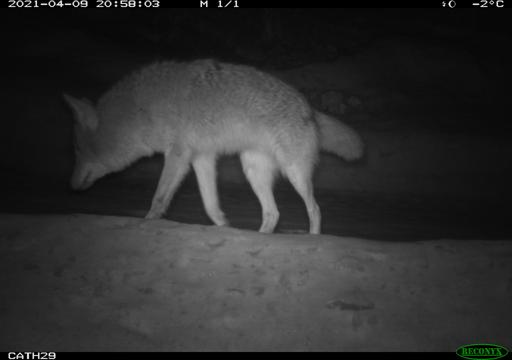

,Unnamed: 0,X,station,image_name,latin_name,date_time,project,filepath,group,pred,full_filepath,new_filepath
8233,114001,158414,CATH29,CATH29__2021-04-09__20-58-03.jpg,Canis latrans,2021-04-09 20:58:03,CATH,CATH/CATH29/CATH29__2021-04-09__20-58-03.jpg,Canid Spp,pred,/Volumes/Expansion/Data Management/Images//CAT...,/mnt/ssd-cluster/procko/Sampled Images/CATH/CA...


In [3]:
# Create a list to store the match categories
match_categories = []

# Iterate through the true and predicted values
for true_val, pred_val in zip(data['true_labels'], data['pred_labels']):
    if true_val == 1 and pred_val == 1:
        match_categories.append('true_positive')
    elif true_val == 1 and pred_val == 0:
        match_categories.append('false_negative')
    elif true_val == 0 and pred_val == 1:
        match_categories.append('false_positive')
    else:
        match_categories.append('true_negative')

# Add the match categories list to the dictionary
data['match_category'] = match_categories

# pick a random number
n = 1717

# view an example of the updated dictionary
print("This is a", data['match_category'][n], 'where', data['pred_labels'][n], "was the prediction,",
data['true_labels'][n], 'was the true value, and the score values were', data['scores'][n])

# show the image
img = data['filepaths'][n]
pil_im = Image.open(img)
display(pil_im)

raw_data[raw_data['new_filepath'] == data['filepaths'][n]]

In [4]:
# how many images to display?
x = 25

# create false positives dictionary:
# false_positives = []
# for category, scores, filepaths in zip(data['match_category'], data['scores'], data['filepaths']):
#     if category == 'false_positive':
#         false_positives.append({'match_category': category, 'scores': scores, 'filepaths': filepaths})

# # sort by highest false confidence:
# sorted_false_positives = sorted(false_positives, key=lambda x: x['scores'][1], reverse=True)
# display_images = sorted_false_positives[0:x]

# create false negatives dictionary:
# false_negatives = []
# for category, scores, filepaths in zip(data['match_category'], data['scores'], data['filepaths']):
#     if category == 'false_negative':
#         false_negatives.append({'match_category': category, 'scores': scores, 'filepaths': filepaths})

# # sort by highest false confidence:
# sorted_false_negatives = sorted(false_negatives, key=lambda x: x['scores'][0], reverse=True)
# display_images = sorted_false_negatives[0:x]

# # create true positives dictionary:
# true_positives = []
# for category, scores, filepaths in zip(data['match_category'], data['scores'], data['filepaths']):
#     if category == 'true_positive':
#         true_positives.append({'match_category': category, 'scores': scores, 'filepaths': filepaths})

# # sort by highest true confidence:
# sorted_true_positives = sorted(true_positives, key=lambda x: x['scores'][1], reverse=True)
# display_images = sorted_true_positives[0:x]

# # create true negatives dictionary:
true_negatives = []
for category, scores, filepaths in zip(data['match_category'], data['scores'], data['filepaths']):
    if category == 'true_negative':
        true_negatives.append({'match_category': category, 'scores': scores, 'filepaths': filepaths})

# sort by highest true confidence:
sorted_true_negatives = sorted(true_negatives, key=lambda x: x['scores'][0], reverse=True)
display_images = sorted_true_negatives[0:x]


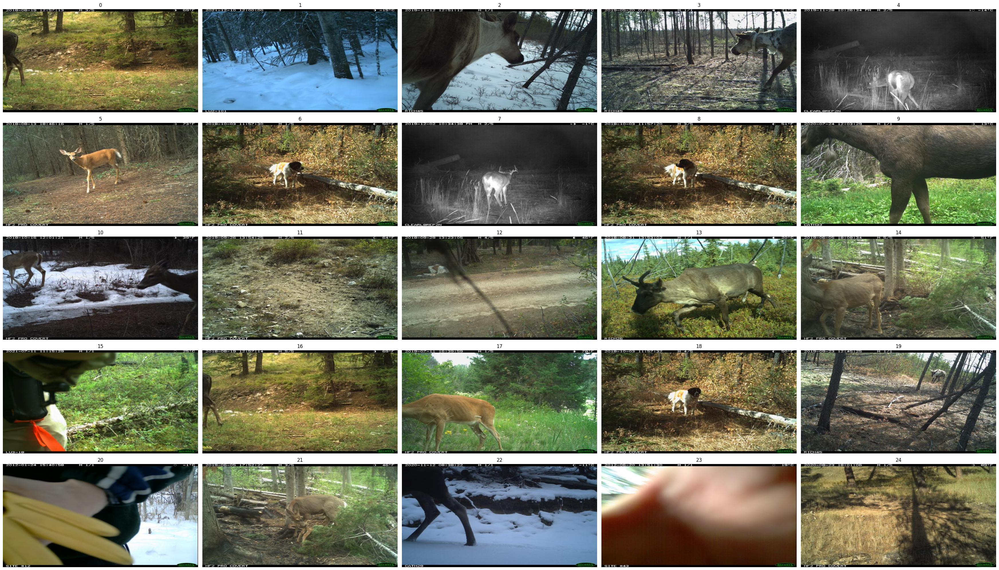

In [5]:
# Display images using the filepaths key
plt.figure(figsize=(35, 20))
for idx, entry in enumerate(display_images):
    img = Image.open(entry['filepaths'])
    plt.subplot(5,5,idx+1)
    plt.imshow(img, aspect='auto')
    plt.title(idx)
    plt.axis('off')
plt.tight_layout() 
plt.show()


In [6]:
display_images

[{'match_category': 'true_negative',
  'scores': [0.8760568499565125, 0.12394316494464874],
  'filepaths': '/mnt/ssd-cluster/procko/Sampled Images/WPPP/OK4865/Camera_67/C215_6.9.19/DCIM/101RECNX/RCNX0118.JPG'},
 {'match_category': 'true_negative',
  'scores': [0.8698789477348328, 0.130121111869812],
  'filepaths': '/mnt/ssd-cluster/procko/Sampled Images/OSM/OSM/LU2_101/Deployment 1/IMG_0893.JPG'},
 {'match_category': 'true_negative',
  'scores': [0.8603686690330505, 0.13963131606578827],
  'filepaths': '/mnt/ssd-cluster/procko/Sampled Images/Richardson/RICH45/Rich45__2019-11-12__12-51-12.JPG'},
 {'match_category': 'true_negative',
  'scores': [0.8534199595451355, 0.1465800404548645],
  'filepaths': '/mnt/ssd-cluster/procko/Sampled Images/Richardson/RICH45/Rich45__2019-05-20__07-28-20.JPG'},
 {'match_category': 'true_negative',
  'scores': [0.8514789342880249, 0.14852102100849152],
  'filepaths': '/mnt/ssd-cluster/procko/Sampled Images/M2M/JA/R2_CC/R2_CC__2019-11-28__22-26-347.JPG'},
 {